In [1]:
from pathlib import Path
import random
import json

import yaml
import cv2
import matplotlib.pyplot as plt

from models.sift.detect import SIFTDetector
from models.sift.evaluate import DetectorEvaluator
from models.sift.model_utils import visualize_case

In [2]:
# TODO: Retrieve-Reconstruct Fialures
# TODO: Sample and Visualise Results with IoU
# TODO: Implement Runs

In [3]:
# -- LOADERS -- #
def load_dataset(config):
    """Load dataset from config paths"""
    # Get root paths
    project_root = Path(config['paths']['project_root'])
    data_root = project_root / config['paths']['data_root']
    
    # Load annotations
    ann_path = data_root / config['data']['annotations_path']
    with open(ann_path, 'r') as f:
        annotations = json.load(f)
    
    # Process images - add full path
    img_root = data_root / config['data']['img_root']
    for img in annotations['images']:
        # Convert relative path to full path
        img['file_name'] = str(img_root / img['file_name'])
    
    # Process annotations
    ann_dict = {}
    for ann in annotations['annotations']:
        img_id = ann['image_id']
        if img_id not in ann_dict:
            ann_dict[img_id] = []
        ann_dict[img_id].append(ann)
    
    return annotations['images'], ann_dict

def load_templates(config):
    """Load template images from config"""
    project_root = Path(config['paths']['project_root'])
    data_root = project_root / config['paths']['data_root']
    
    templates = {
        class_id: cv2.imread(str(data_root / path), cv2.IMREAD_GRAYSCALE)
        for class_id, path in config['model']['template_paths'].items()
    }
    
    # Verify all templates were loaded
    failed_templates = [class_id for class_id, img in templates.items() if img is None]
    if failed_templates:
        raise ValueError(f"Failed to load templates for classes: {failed_templates}")
        
    return templates

In [4]:
# -- CONFIG -- #
with open('models/sift/sift_config.yaml', 'r') as f:
    config = yaml.safe_load(f)

imgs, annotations = load_dataset(config)

templates = {
    class_id: cv2.imread(
        str(Path(config['paths']['project_root']) / config['paths']['data_root'] / path), 
        cv2.IMREAD_GRAYSCALE
    )
    for class_id, path in config['model']['template_paths'].items()
}

In [5]:
# -- INTIT MODEL -- #
detector = SIFTDetector(templates)
evaluator = DetectorEvaluator(iou_threshold=config["evaluation"]["iou_threshold"])

In [6]:
metrics, failures = evaluator.evaluate(
    imgs=imgs,
    annotations=annotations,
    detector_fn=detector.detect_objects,
    run_name="sift_detector"
)

2025-02-16 01:22:30,437 - INFO - Starting evaluation run: sift_detector
2025-02-16 01:22:30,868 - INFO - Detected 1 at [16, 1150, 408, 446]
2025-02-16 01:22:30,933 - INFO - Detected 2 at [1040, 1282, 354, 125]
2025-02-16 01:22:31,167 - INFO - Detected 1 at [651, 925, 159, 130]
2025-02-16 01:22:31,204 - INFO - Detected 2 at [848, 948, 212, 75]
2025-02-16 01:22:31,495 - INFO - Detected 1 at [422, 700, 47, 29]
2025-02-16 01:22:31,551 - INFO - Detected 2 at [741, 922, 305, 108]
2025-02-16 01:22:31,765 - INFO - Detected 1 at [654, 925, 160, 132]
2025-02-16 01:22:31,794 - INFO - Detected 2 at [853, 949, 212, 75]
2025-02-16 01:22:32,183 - INFO - Detected 1 at [647, 1767, 160, 132]
2025-02-16 01:22:32,230 - INFO - Detected 2 at [846, 1791, 212, 75]
2025-02-16 01:22:32,539 - INFO - Detected 1 at [696, 1204, 141, 116]
2025-02-16 01:22:32,594 - INFO - Detected 2 at [860, 1226, 195, 69]
2025-02-16 01:22:32,831 - INFO - Detected 1 at [699, 35, 148, 122]
2025-02-16 01:22:32,867 - INFO - Detected 2 a

In [7]:
metrics

{0: {'precision': 0.0,
  'recall': 0.0,
  'f1': 0.0,
  'total_predictions': 0,
  'total_ground_truth': 29},
 2: {'precision': 0.9835164781125468,
  'recall': 0.9781420711576936,
  'f1': 0.9808214124378605,
  'total_predictions': 182,
  'total_ground_truth': 183},
 1: {'precision': 0.9999999935483872,
  'recall': 0.9810126520189073,
  'f1': 0.9904148291809117,
  'total_predictions': 155,
  'total_ground_truth': 158}}

In [8]:
print(len(failures))
failures

36


defaultdict(<function models.sift.evaluate.DetectorEvaluator.evaluate.<locals>.<lambda>()>,
            {0: {'false_positives': [],
              'false_negatives': [[1028.0532043530836,
                118.22611850060458,
                328.9770253929868,
                366.67230955259976]],
              'low_iou': []},
             1: {'false_positives': [],
              'false_negatives': [[804.782608695652,
                100.43478260869556,
                213.91304347826116,
                241.3043478260869]],
              'low_iou': []},
             2: {'false_positives': [],
              'false_negatives': [[399.13043478260863,
                586.9565217391304,
                217.82608695652172,
                243.91304347826087]],
              'low_iou': []},
             7: {'false_positives': [[221, 857, 177, 348]],
              'false_negatives': [[735.1443850267381,
                1768.0427807486633,
                271.0588235294117,
                88.2994

/tmp/ipykernel_3329/1054768163.py:1: DeprecationWarning: Sampling from a set deprecated
since Python 3.9 and will be removed in a subsequent version.
  failures_ = dict(list(random.sample(failures.items(), 3)))



Analyzing failures for class 164


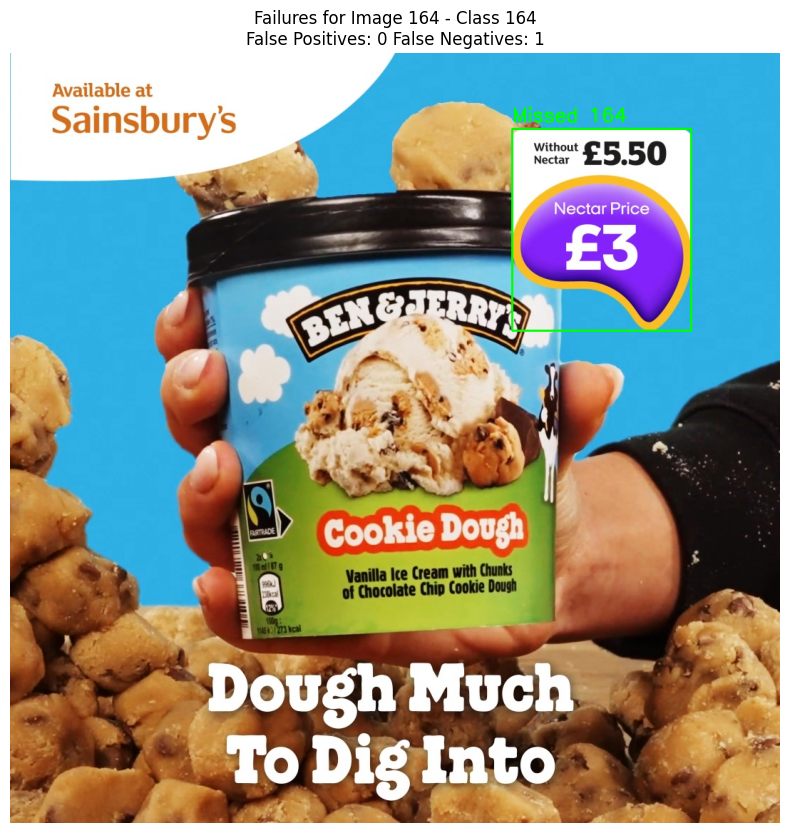

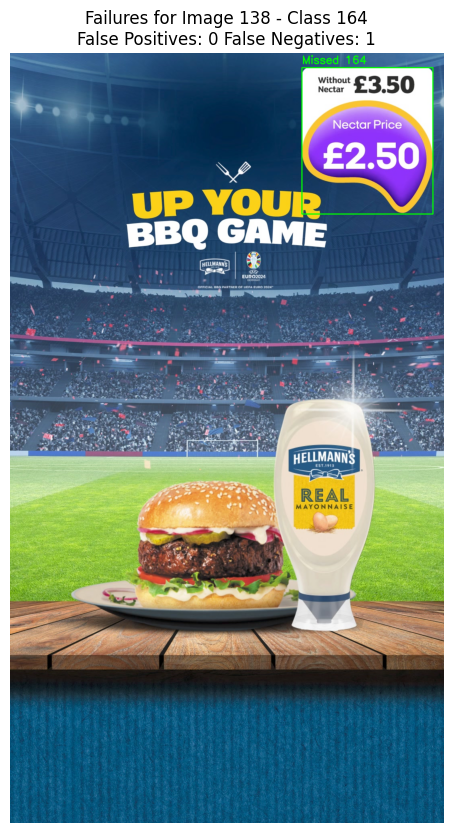

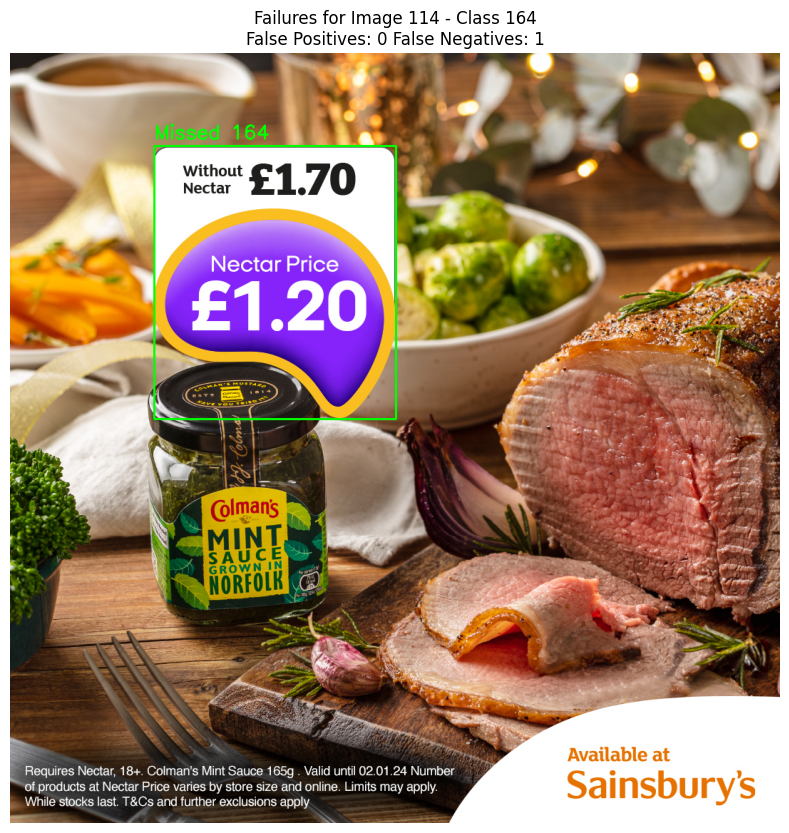


Analyzing failures for class 138


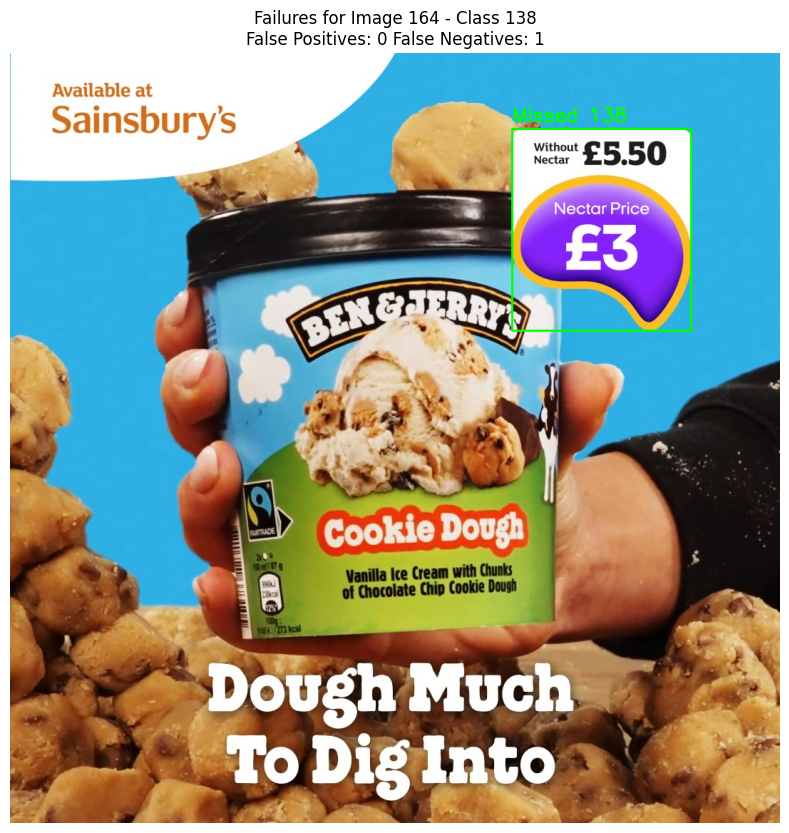

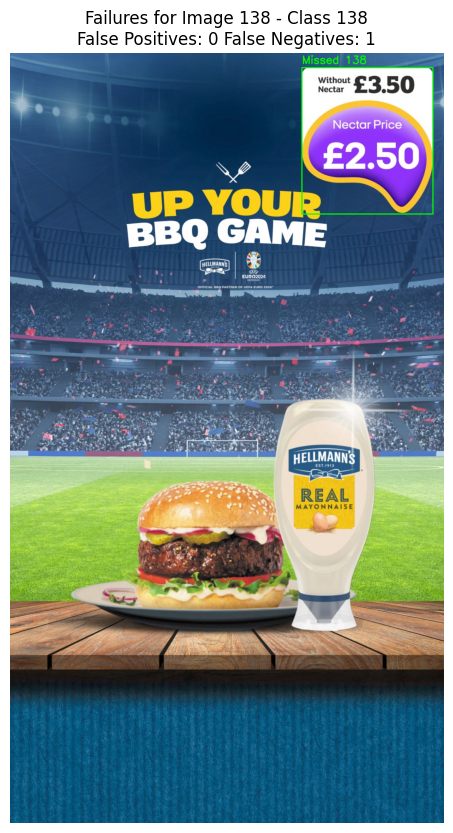

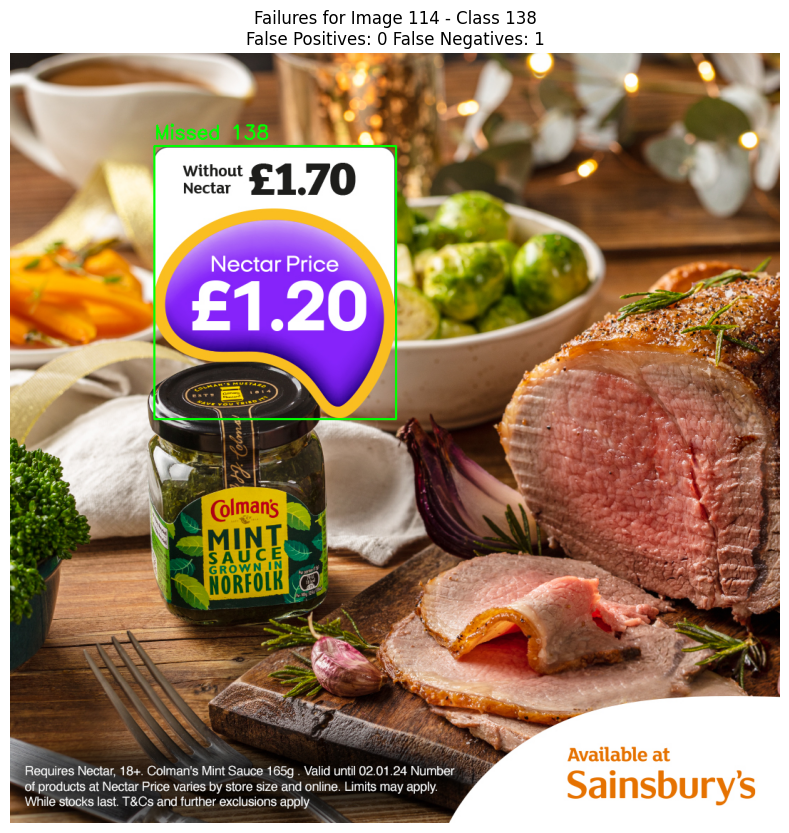


Analyzing failures for class 114


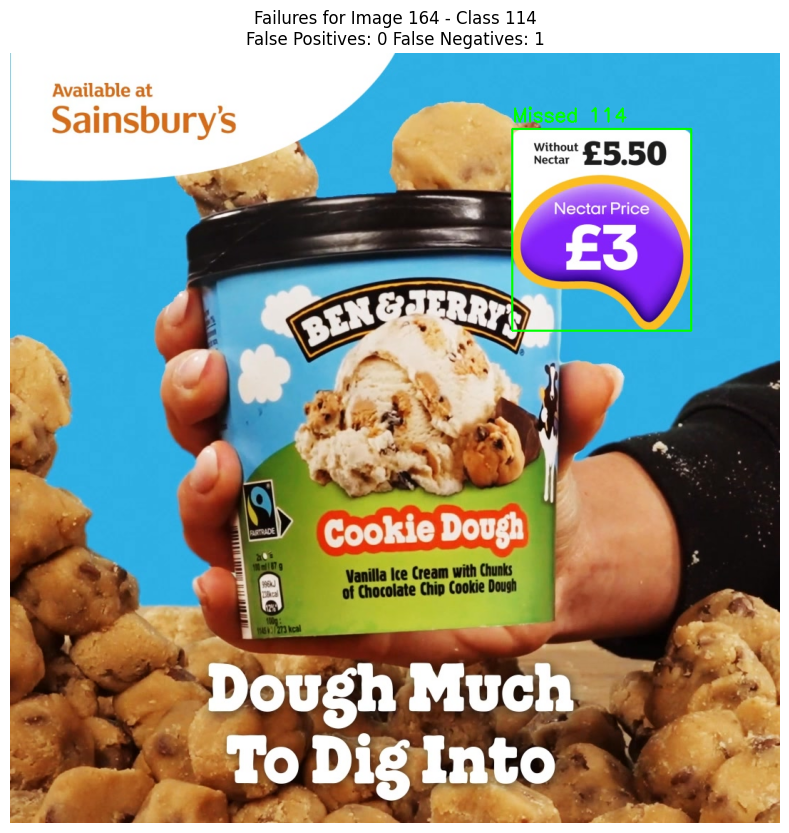

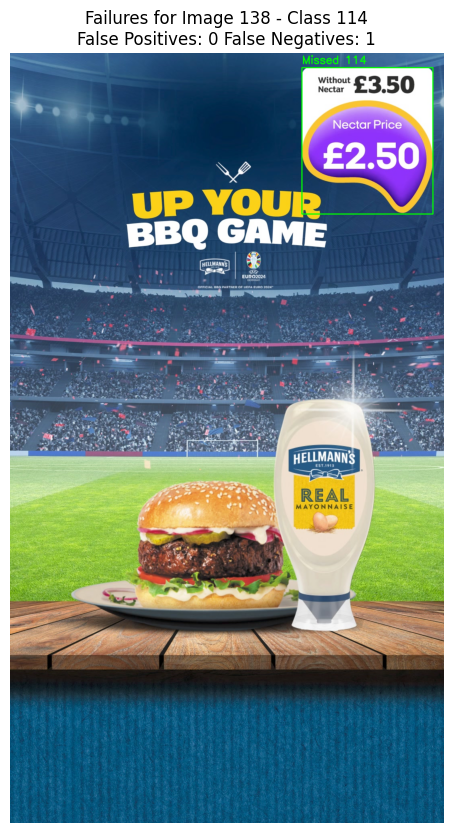

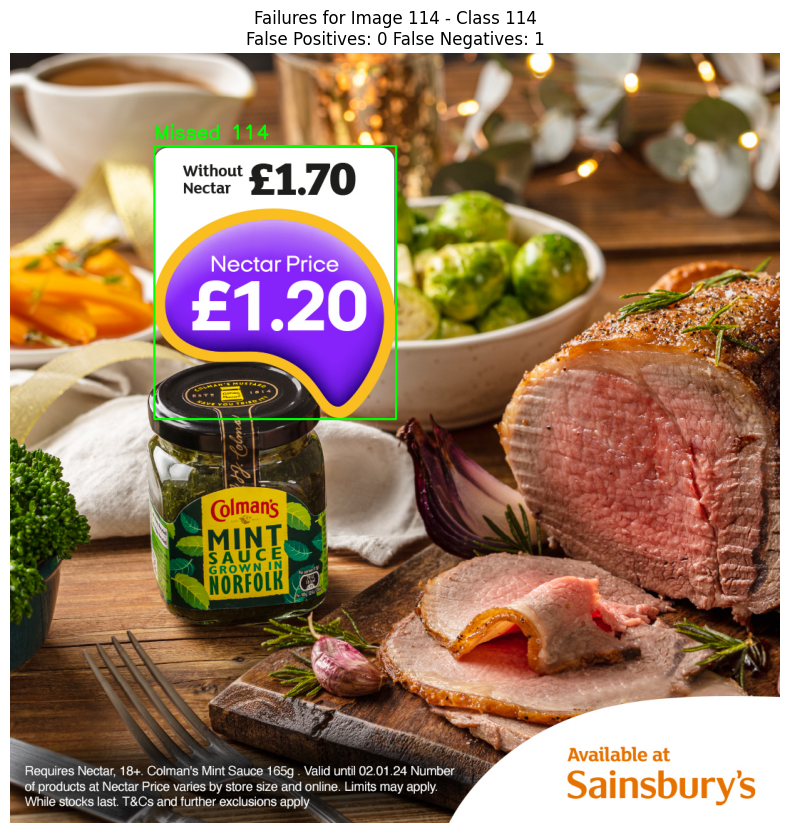

In [ ]:
failures_ = dict(list(random.sample(failures.items(), 3)))

for class_id in failures_.keys():
    print(f"\nAnalyzing failures for class {class_id}")
    
    # Find images with failures for this class
    for img_idx, failure_data in failures_.items():
        if (len(failure_data['false_positives']) > 0 or 
            len(failure_data['false_negatives']) > 0):
            
            # Find corresponding image data
            img_data = next((img for img in imgs if img['id'] == img_idx), None)
            if img_data is None:
                print(f"Warning: Could not find image data for index {img_idx}")
                continue
            
            visualize_case(img_data, failure_data, class_id)